In [1]:
import cv2
import numpy as np
import imutils
from matplotlib import pyplot as plt

In [2]:
def calculate_average_distance(image):
    distance_list = []
    for row in image:
        for (b, g, r) in row:
            if(b != 0 and g != 0 and r != 0):
                
                # Calculate distance
                value = abs(int(b) - int(g)) + abs(int(b) - int(r)) + abs(int(r) - int(g))

                # Append calculated value
                distance_list.append(value)

    # Cast list to numpy array
    distance_list = np.array(distance_list, dtype="int")

    # Calculate average
    avg = np.average(distance_list)
    return avg

In [3]:
def decision(avg, avg_ctr):
    if avg <= 90:
        return "1"
    else:
        return konflikt(avg_ctr)

In [4]:
def konflikt(avg):
    if avg <= 130:
        return "2"
    else:
        return "5"

In [5]:
def color(decision):
    if decision == 5:
        return (0,255,0)
    elif decision == 2:
        return (255,0,0)
    else:
        return (0,0,255)

In [10]:
def skalowanie(shape):
    if shape[1] > 1000:
        return [3.7, 4]
    else:
        return [1.3, 1.5]

In [11]:
def wycinanie(img,i):
    wycinki = []
    centra = []
    text = []
    contour = []
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (39,39), 0)
    
    ret2, thresh2 = cv2.threshold(blur,0,255, 
                                  cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    ret, thresh = cv2.threshold(blur,ret2,255, cv2.THRESH_BINARY_INV)
    
    canny = cv2.Canny(thresh, 20, 120)
    dilated = cv2.dilate(canny, (1,1), iterations = 2)
    
    contours = cv2.findContours(dilated.copy(), cv2.RETR_EXTERNAL, 
                                       cv2.CHAIN_APPROX_NONE)
    cnts = imutils.grab_contours(contours)
    cnts = sorted(cnts, key=cv2.contourArea, reverse=True)[:4]
    
    for cnt in cnts:
        mask = np.zeros(gray.shape, np.uint8)
        new = cv2.drawContours(mask, [cnt], 0, 255, -1)
        new = cv2.bitwise_and(img, img, mask=mask)
        
        M = cv2.moments(cnt)
        cX = int(M["m10"] / M["m00"])
        cY = int(M["m01"] / M["m00"])
        
        (x,y) = np.where(mask==255)
        (x1,y1) = (np.min(x), np.min(y))
        (x2,y2) = (np.max(x), np.max(y))
        crop_img = img[x1:x2+1, y1:y2+1]
        
        x1 = int(crop_img.shape[0] / 4)
        x2 = int(3 * crop_img.shape[0] / 4)
        y1 = int(crop_img.shape[1] / 4)
        y2 = int(3 * crop_img.shape[1] / 4)
        
        centrum = crop_img[x1:x2, y1:y2]
        
        wycinki.append(crop_img)
        centra.append(centrum)
        text.append((cX,cY))
        contour.append(cnt)
        
    return wycinki, centra, text, contour

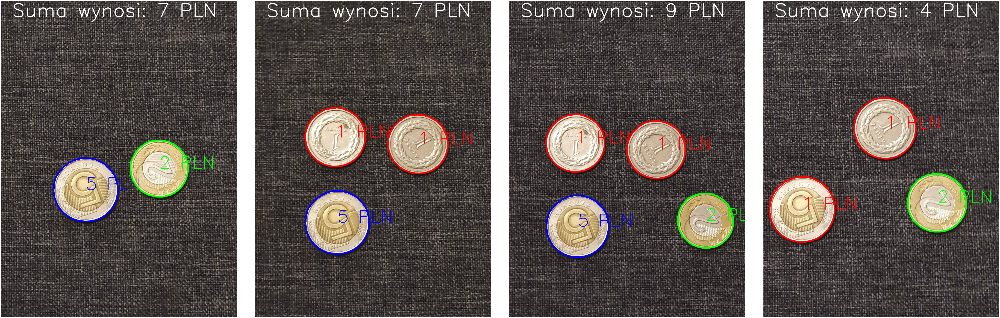

In [12]:
tab = ["m1.jpg","m2.jpg", "m3.jpg","m4.jpg",
       "m5.jpg","m6.jpg", "m7.jpg","m8.jpg",
       "m9.jpg","m10.jpg", "m11.jpg","m12.jpg",
       "m13.jpg","m14.jpg", "m15.jpg","m16.jpg",
       "m17.jpg","m18.jpg", "m19.jpg","m20.jpg"]

#tab = ["m13.jpg","m14.jpg", "m15.jpg","m16.jpg",
#       "m17.jpg","m18.jpg", "m19.jpg","m20.jpg"]


fig = plt.figure(figsize = (100,100))
for i in range(len(tab)):
    img = cv2.imread(tab[i])
    skala = skalowanie(img.shape)
    wycinki, centra, text, contour = wycinanie(img,i)
    suma = 0
    for j in range(len(wycinki)):            
        avg = calculate_average_distance(wycinki[j])
        #print("Avg", avg)
        
        center_avg = calculate_average_distance(centra[j])
        #print("Avg_ctr", center_avg)
        
        decyzja = int(decision(avg, center_avg))
        #print("Moneta", decyzja)
        
        suma += decyzja
        
        cv2.drawContours(img, contour[j], -1, color(decyzja), 10)
        cv2.putText(img, str(decyzja)+" PLN", text[j], cv2.FONT_HERSHEY_SIMPLEX, skala[0], color(decyzja), 3)
    cv2.putText(img, "Suma wynosi: "+str(suma)+" PLN", (70,125), cv2.FONT_HERSHEY_SIMPLEX, skala[1], (255, 255, 255), 5)
       
    fig.add_subplot(4, 5, i + 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    
fig.tight_layout()